In [38]:
import matplotlib.pyplot as plt

import numpy as np

#for loading and visualizing audio files
import librosa
import librosa.display

#to play audio
import IPython.display as ipd

In [39]:
path = "./raw/" # INSERT PATH
file = "Mela_-_03_-_Horrible.mp3" # INSERT FILE

# Simple

https://towardsdatascience.com/music-genre-classification-with-python-c714d032f0d8

In [40]:
x, sr = librosa.load(path+file, sr=44100)
print(type(x), type(sr))

<class 'numpy.ndarray'> <class 'int'>


In [41]:
print(x.shape, sr)

(11713024,) 44100


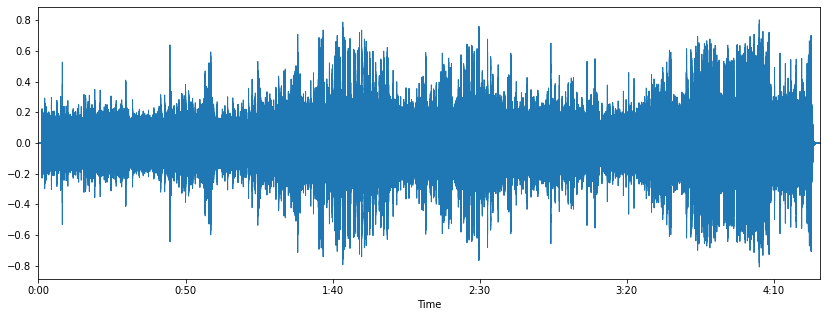

In [42]:
plt.figure(figsize=(14, 5))
librosa.display.waveplot(x, sr=sr)

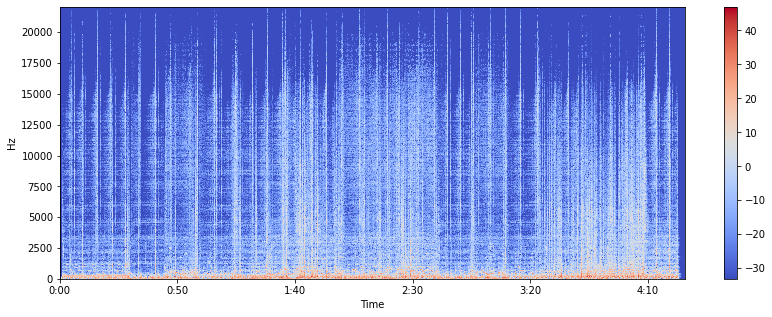

In [43]:
X = librosa.stft(x)
Xdb = librosa.amplitude_to_db(abs(X))
plt.figure(figsize=(14, 5))
librosa.display.specshow(Xdb, sr=sr, x_axis='time', y_axis='hz')
plt.colorbar()

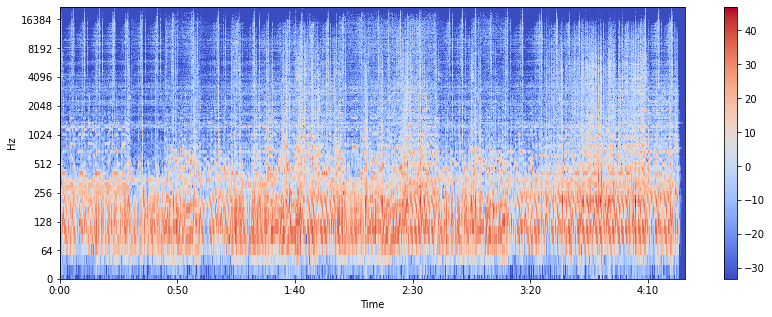

In [44]:
plt.figure(figsize=(14, 5))
librosa.display.specshow(Xdb, sr=sr, x_axis='time', y_axis='log')
plt.colorbar()

# Melspectrogram

https://towardsdatascience.com/getting-to-know-the-mel-spectrogram-31bca3e2d9d0

song, _ = librosa.effects.trim(x)
librosa.display.waveplot(song, sr=sr)

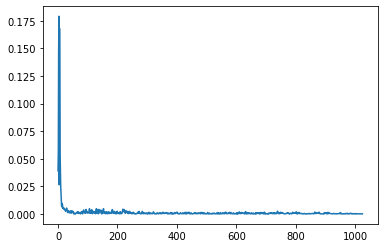

In [46]:
n_fft = 2048

D = np.abs(librosa.stft(song[:n_fft], n_fft=n_fft, hop_length=n_fft+1))
plt.plot(D);

## Amplitude must be converted to decibels or else the below happens

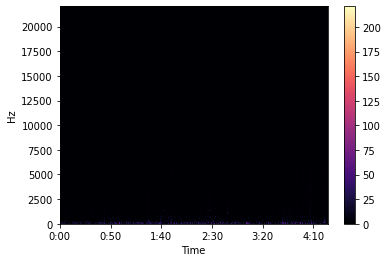

In [47]:
hop_length = 512
D = np.abs(librosa.stft(song, n_fft=n_fft,  hop_length=hop_length))
librosa.display.specshow(D, sr=sr, x_axis='time', y_axis='linear')
plt.colorbar()

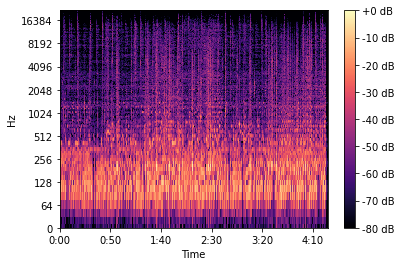

In [55]:
DB = librosa.amplitude_to_db(D, ref=np.max)
librosa.display.specshow(DB, sr=sr, hop_length=hop_length, x_axis='time', y_axis='log');
plt.colorbar(format='%+2.0f dB');

In [56]:
n_mels = 128
mel = librosa.filters.mel(sr=sr, n_fft=n_fft, n_mels=n_mels)

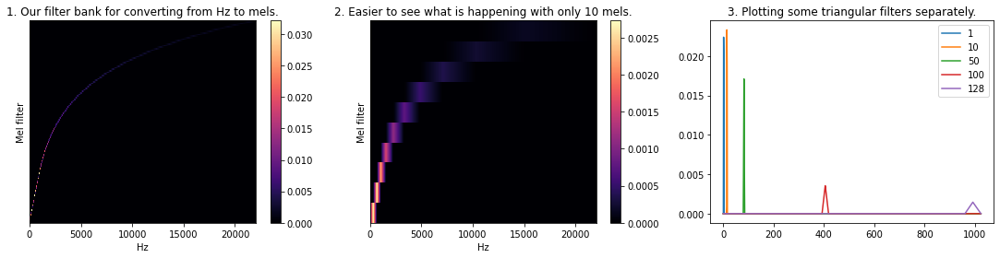

In [57]:
plt.figure(figsize=(15, 4));

plt.subplot(1, 3, 1);
librosa.display.specshow(mel, sr=sr, hop_length=hop_length, x_axis='linear');
plt.ylabel('Mel filter');
plt.colorbar();
plt.title('1. Our filter bank for converting from Hz to mels.');

plt.subplot(1, 3, 2);
mel_10 = librosa.filters.mel(sr=sr, n_fft=n_fft, n_mels=10)
librosa.display.specshow(mel_10, sr=sr, hop_length=hop_length, x_axis='linear');
plt.ylabel('Mel filter');
plt.colorbar();
plt.title('2. Easier to see what is happening with only 10 mels.');

plt.subplot(1, 3, 3);
idxs_to_plot = [0, 9, 49, 99, 127]
for i in idxs_to_plot:
    plt.plot(mel[i]);
plt.legend(labels=[f'{i+1}' for i in idxs_to_plot]);
plt.title('3. Plotting some triangular filters separately.');

plt.tight_layout();

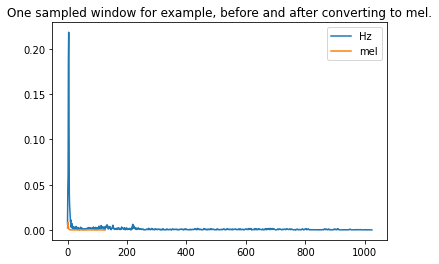

In [58]:
plt.plot(D[:, 1]);
plt.plot(mel.dot(D[:, 1]));
plt.legend(labels=['Hz', 'mel']);
plt.title('One sampled window for example, before and after converting to mel.');

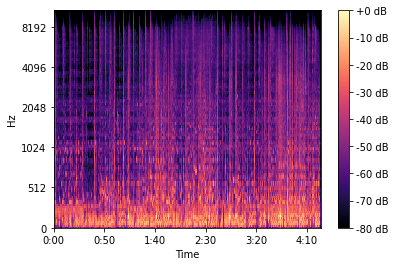

In [59]:
S = librosa.feature.melspectrogram(song, sr=sr, n_fft=n_fft, hop_length=hop_length, n_mels=n_mels)
S_DB = librosa.power_to_db(S, ref=np.max)
librosa.display.specshow(S_DB, sr=sr, hop_length=hop_length, x_axis='time', y_axis='mel');
plt.colorbar(format='%+2.0f dB');

In [60]:
# Sanity check that indeed we understood the underlying pipeline
S = librosa.feature.melspectrogram(song, sr=sr, n_fft=n_fft, hop_length=hop_length, n_mels=n_mels)
fft_windows = librosa.stft(song, n_fft=n_fft, hop_length=hop_length)
magnitude = np.abs(fft_windows)**2
mel = librosa.filters.mel(sr=sr, n_fft=n_fft, n_mels=n_mels)

In [61]:
assert (mel.dot(magnitude) == S).all()